
# **How to train YoloV5 algorithm on drone dataset.**


This tutorial provides an example of training the YOLOv5 algorithm using the drone dataset provided in this [Github repository](https://github.com/InancGorgulu/YOLO-Project/yolov5_training/dataset). The Google Colab environment was specifically chosen for its ability to deliver faster training results.

## Steps included in this tutorial
* Install the YOLOv5 dependencies.
* Upload the required dataset to the cloud machine.
* Train the model.
* Evaluate the results.
* Run inference with the trained model.
* Save the weights.



## Install the YOLOv5 dependencies


Clone YoloV5 repository and install the required libraries for Python.

In [ ]:
!git clone https://github.com/ultralytics/yolov5
!pip install -U -r yolov5/requirements.txt

Cloning into 'yolov5'...
remote: Enumerating objects: 16965, done.
remote: Counting objects: 100% (160/160), done.
remote: Compressing objects: 100% (111/111), done.
remote: Total 16965 (delta 82), reused 100 (delta 49), pack-reused 16805 (from 1)
Receiving objects: 100% (16965/16965), 15.71 MiB | 16.97 MiB/s, done.
Resolving deltas: 100% (11615/11615), done.
  Using cached numpy-2.1.1-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (60 kB)


Check the current Colab hardware specifications. If Colab doesn't use GPU, please select GPU for more robust and faster training.

In [ ]:
import torch
from IPython.display import Image

print('torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

torch 2.4.1+cu121 _CudaDeviceProperties(name='Tesla T4', major=7, minor=5, total_memory=15102MB, multi_processor_count=40)


## Upload the required dataset to the cloud machine

### Upload with Roboflow API

You can use the Roboflow API as shown below to upload your dataset to your cloud machine.
**To use this code consistently, you must first export the required dataset from the Roboflow environment. When you attempt to export the dataset on Roboflow, the code snippet provided below will be generated for you. Otherwise, you will need to replace the 'API_KEY' and 'rf.workspace(YOUR_WORKSPACE).project(YOUR_PROJECT)' sections with your own specifications.**

In [ ]:
!pip install roboflow

from roboflow import Roboflow

rf = Roboflow(api_key="API_KEY")
project = rf.workspace("YOUR_WORKSPACE").project("YOUR_PROJECT")
version = project.version(3)
dataset = version.download("yolov5")


### Upload with Google Drive

You can upload the dataset to your Google Drive and use it within the Google Colab environment.

 <u>_Note that it is preferable to upload the required dataset to the Google Drive account that you are logged into in your Colab environment._</u>

Import the required _drive_ section from the Google library.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


You can use the _unrar package_ to extract the .rar file in your drive.

In [ ]:
!pip install unrar

In [ ]:
!unrar x /content/drive/MyDrive/DroneDatasetYOLO.rar


UNRAR 6.11 beta 1 freeware      Copyright (c) 1993-2022 Alexander Roshal


Extracting from /content/drive/MyDrive/DroneDatasetYOLO.rar

Creating    DroneDatasetYOLO                                          OK
Creating    DroneDatasetYOLO/test                                     OK
Creating    DroneDatasetYOLO/test/images                              OK
Extracting  DroneDatasetYOLO/test/images/desktop.ini                       0%  OK 
Extracting  DroneDatasetYOLO/test/images/pic_498.jpg                       0%  OK 
Extracting  DroneDatasetYOLO/test/images/pic_499.jpg                       0%  OK 
Extracting  DroneDatasetYOLO/test/images/pic_500.jpg                       0%  OK 
Extracting  DroneDatasetYOLO/test/images/pic_501.jpg                       0%  OK 
Extracting  DroneDatasetYOLO/test/images/pic_502.jpg                       0%  OK 
Extracting  DroneDatasetYOLO/test/images/pic_504.jpg                       0%  OK 


### Upload with GDown
You can use the `gdown` library to download datasets directly from Google Drive:
    

In [ ]:
!pip install gdown

!gdown https://drive.google.com/uc?id=your_file_id

## Train the model

When training a YOLOv5 model, various parameters can be configured to control the behavior of the training process. Understanding these parameters is crucial for optimizing model performance and training efficiency. Below is a detailed explanation of the most commonly used parameters in the training command. Adjust these parameters based on your dataset size, hardware capabilities, and desired training outcome to achieve the best results:

- **img:** Specifies the input image size. In this case, images will be resized to 416x416 pixels before being fed into the model.

<u>_Larger sizes typically lead to better accuracy but require more computational resources._</u>

- **batch:** Sets the batch size, meaning the number of images that will be processed together in a single batch during training.


<u>_A larger batch size can speed up training but also requires more memory. Smaller batch sizes may lead to better generalization._</u>


- **epochs:** Defines the number of training epochs. An epoch is one complete pass through the entire training dataset.

<u>_More epochs allow the model to learn better, but too many can lead to [overfitting](https://en.wikipedia.org/wiki/Overfitting)._</u>

- **data:** Specifies the path to the data.yaml file, which contains information about the dataset, such as the path to the training, validation, and test images, as well as class names and the number of classes.

<u>_This file is crucial for configuring the training data paths and class definitions._</u>

- **cfg:** Provides the path to the custom model configuration file (.yaml) for YOLOv5. This file contains the architecture details of the model such as the number of layers, channels, and anchor boxes.

<u>_Use this parameter to define a custom model structure or modify an existing model to suit your data._</u>

- **weights:** Specifies the path to the weights file. Leaving it empty ('') means that no pre-trained weights are loaded and the model will be trained from scratch.

<u>_You can use a path to pre-trained weights (e.g., yolov5s.pt) to perform transfer learning, or leave it empty to start with random weights._</u>

- **name:** Sets the name of the experiment.

- **cache:** Caches images and labels in memory for faster training.

<u>_Speeds up training by reducing the disk I/O for loading images. Useful when the dataset is small enough to fit into memory._</u>

- **nosave:** nosave: Only saves the final checkpoint, skipping intermediate model checkpoints during training.

<u>_This parameter reduces disk space usage and speeds up training slightly by avoiding the storage of intermediate model states. It is useful when you are only interested in the final trained model and do not need to revert to earlier checkpoints._</u>

The arguments that provided to run this training are chosen arbitrary. Please change the parameters (especially the img, batch and epoch) to achieve more consistent and accurate training results in your dataset.

In [13]:
# Use %%time to calculate the CPU and Wall Time of this code block.

# Change the path to yolov5 repository.
%cd /content/yolov5/

# Start the training with 200 epochs.

!python /content/yolov5/train.py --img 416 --batch 32 --epochs 200 --cfg /content/drive/MyDrive/custom_yolov5s.yaml --data /content/DroneDatasetYOLO/data.yaml --weights '/content/drive/MyDrive/best.pt' --name yolov5s_results  --cache

Görüntülenen çıkış son 5000 satıra kısaltıldı.
  with torch.cuda.amp.autocast(amp):
     72/199      3.46G    0.03364     0.0137          0         76        416:   6% 1/17 [00:00<00:03,  5.18it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     72/199      3.46G     0.0345    0.01694          0        102        416:  12% 2/17 [00:00<00:03,  4.29it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     72/199      3.46G    0.03431    0.01578          0         74        416:  18% 3/17 [00:00<00:03,  4.62it/s]/content/yolov5/train.py:412: FutureWarning: `torch.cuda.amp.autocast(args...)` is deprecated. Please use `torch.amp.autocast('cuda', args...)` instead.
  with torch.cuda.amp.autocast(amp):
     72

## Evaluate the results

During training, loss values and performance metrics are recorded in Tensorboard as well as in a log file specified by the --name flag. In our example, we used the name yolov5s_results. (If no name is provided, the default file name is results.txt.) Once the training is complete, the results file is automatically visualized as a PNG image.

In [15]:
%load_ext tensorboard
# Log save in the folder `runs` by Yolo algorithm.
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

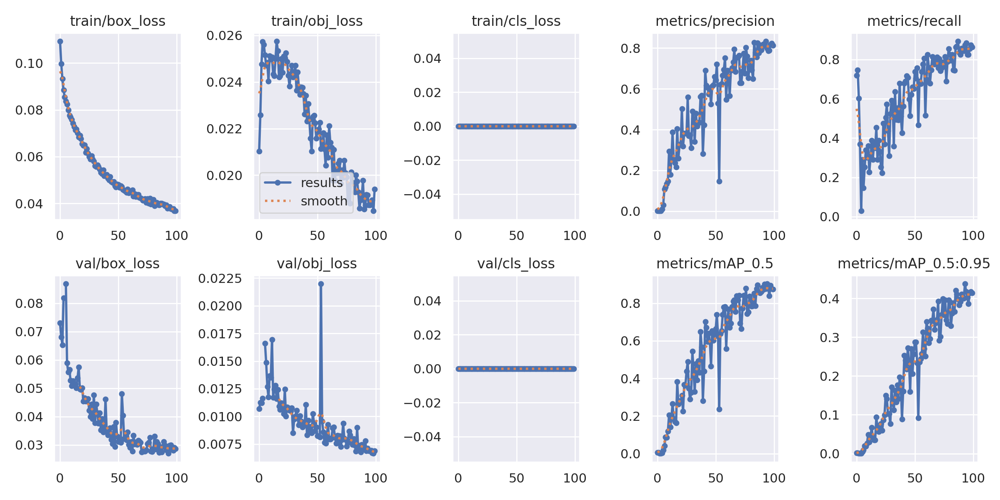

In [ ]:
from IPython.display import Image, display
# You can plot the results with 'utils.plots' if the Tensorflow doesn't work.
from utils.plots import plot_results  # plot results.txt as results.png
Image(filename='/content/yolov5/runs/train/yolov5s_results/results.png', width=1500)

## Run inference with the trained model

Run inference using the trained model on the test dataset to detect objects, specifying the model's weight file, the image size for inference, a confidence threshold for filtering predictions, and the directory containing the test images.

In [18]:
%cd /content/yolov5/
!python detect.py --weights runs/train/yolov5s_results4/weights/best.pt --img 416 --conf 0.4 --source /content/DroneDatasetYOLO/test/images/

/content/yolov5
detect: weights=['runs/train/yolov5s_results4/weights/best.pt'], source=/content/DroneDatasetYOLO/test/images/, data=data/coco128.yaml, imgsz=[416, 416], conf_thres=0.4, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_format=0, save_csv=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False, vid_stride=1
YOLOv5 🚀 v7.0-368-gb163ff8d Python-3.10.12 torch-2.4.1+cu121 CUDA:0 (Tesla T4, 15102MiB)

Fusing layers... 
custom_YOLOv5s summary: 157 layers, 7012822 parameters, 0 gradients, 15.8 GFLOPs
WARNING ⚠️ NMS time limit 0.550s exceeded
image 1/86 /content/DroneDatasetYOLO/test/images/pic_498.jpg: 416x416 1 Drone, 7.1ms
image 2/86 /content/DroneDatasetYOLO/test/images/pic_499.jpg: 288x416 1 Drone, 28.6ms
image 3/86 /content/DroneDatasetYOLO/test/ima

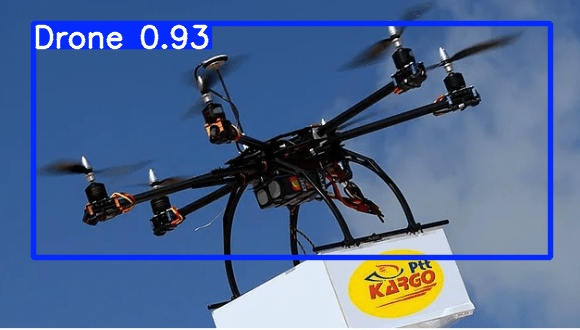

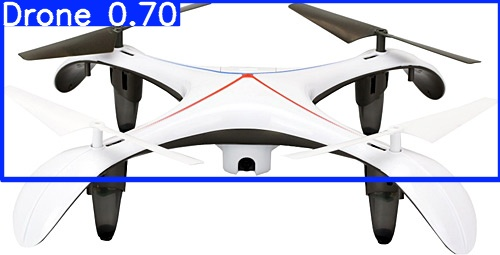

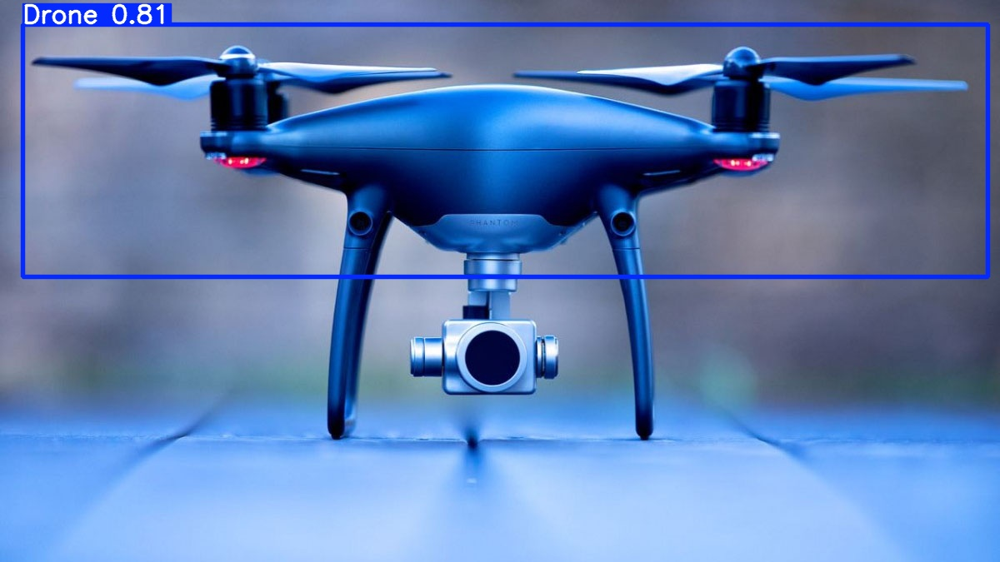

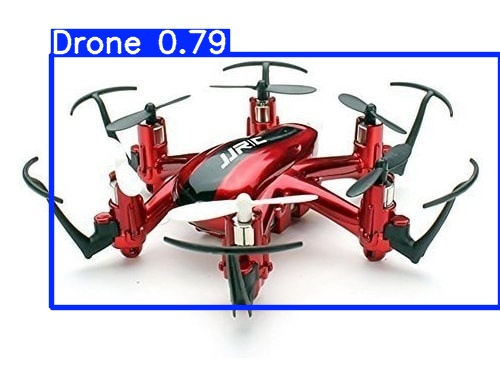

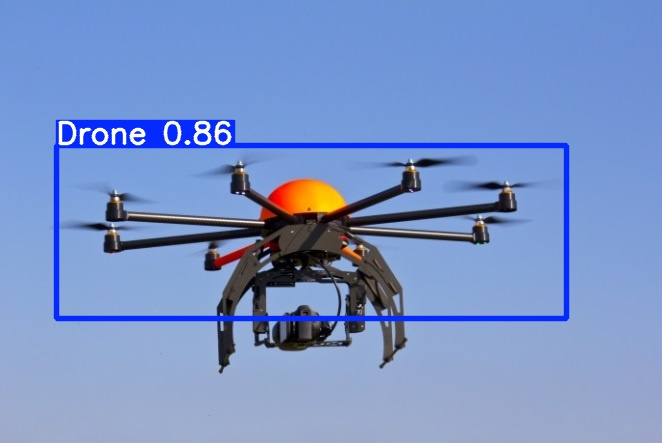

...

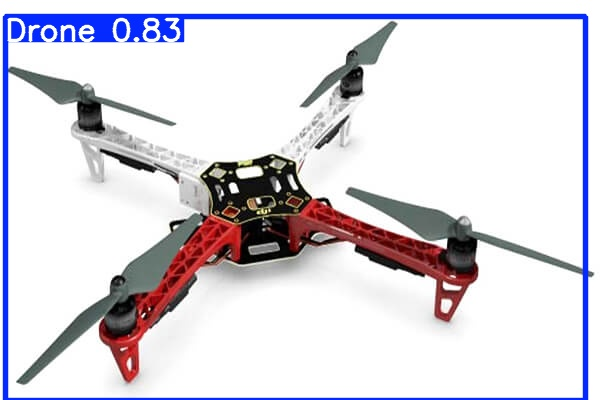

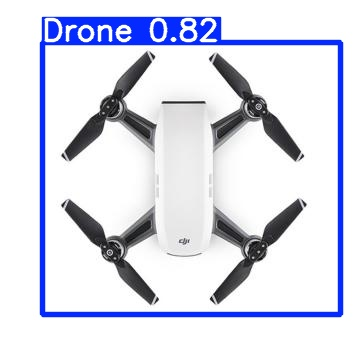

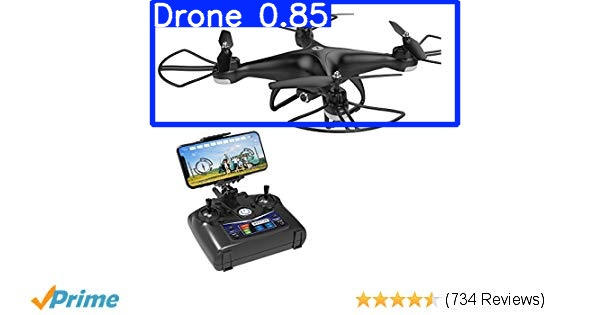

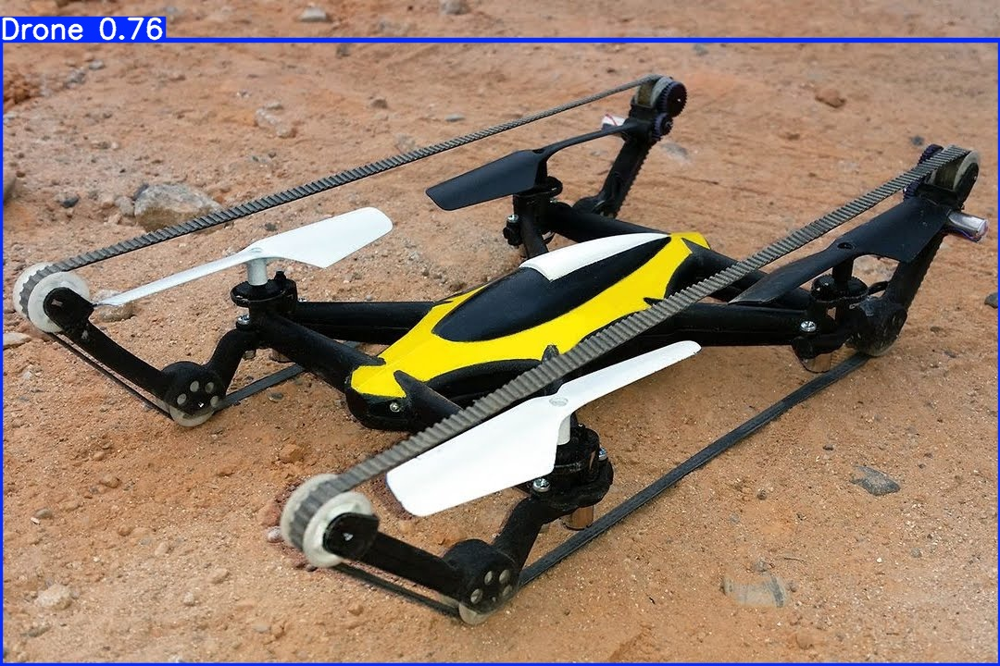

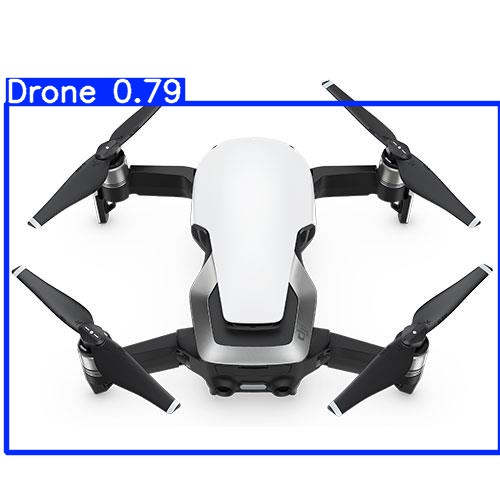

In [19]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'):  # Assuming it's the JPG file, and also, the exp file postfix can change to exp2, exp3, etc., depending on the inference count.
    display(Image(filename=imageName))
    print("\n")

## Save the weights

After completing the training of your custom detector, you can now export the trained weights for inference on other devices.

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [14]:
%cp /content/yolov5/runs/train/yolov5s_results4/weights/best.pt /content/drive/MyDrive

### _Thank you for exploring my project. I hope you find it useful for your own work._